## Урок 1

In [ ]:
#!pip install missingno

In [1]:
from typing import List, Optional
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt

import seaborn as sns
import scipy.stats as st
from scipy.stats import probplot, ks_2samp

from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold, cross_val_score
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_is_fitted
import missingno as msno
import xgboost as xgb


# plt.style.use('fivethirtyeight')
# %config InlineBackend.figure_format = 'svg'
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
train = pd.read_csv(r"./sport_train.csv")
test = pd.read_csv(r"./sport_test.csv")

### Задание 1: Сделать базовый анализ данных: вывести размерность датасетов, посчитать базовые статистики, выполнить анализ пропусков, сделать выводы.

In [3]:
train.head(2)

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.093,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.389,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518


In [4]:
test.head(2)

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,-2.1556,11.8495,-1.4300,2.4508,13.7112,2.4669,4.3654,10.7200,15.4722,-8.7197
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,10.6165,8.8349,0.9403,10.1282,15.5765,0.4773,-1.4852,9.8714,19.1293,-20.9760


In [5]:
train.shape, test.shape

((200000, 202), (200000, 201))

In [6]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [7]:
test.iloc[:, 0:11].describe()

,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,10.658737,-1.624244,10.707452,6.788214,11.076399,-5.050558,5.415164,16.529143,0.277135,7.569407
std,3.036716,4.040509,2.633888,2.052724,1.616456,7.869293,0.864686,3.424482,3.333375,1.231865
min,0.188700,-15.043400,2.355200,-0.022400,5.484400,-27.767000,2.216400,5.713700,-9.956000,4.243300
25%,8.442975,-4.700125,8.735600,5.230500,9.891075,-11.201400,4.772600,13.933900,-2.303900,6.623800
50%,10.513800,-1.590500,10.560700,6.822350,11.099750,-4.834100,5.391600,16.422700,0.372000,7.632000
75%,12.739600,1.343400,12.495025,8.327600,12.253400,0.942575,6.005800,19.094550,2.930025,8.584825
max,22.323400,9.385100,18.714100,13.142000,16.037100,17.253700,8.302500,28.292800,9.665500,11.003600


In [8]:
# na, null
train.isna().sum().values.sum(), train.isnull().sum().values.sum()

(0, 0)

In [9]:
test.isna().sum().values.sum(), test.isnull().sum().values.sum()

(0, 0)

In [ ]:
# msno.matrix(train)
# msno.bar(train, labels=True)

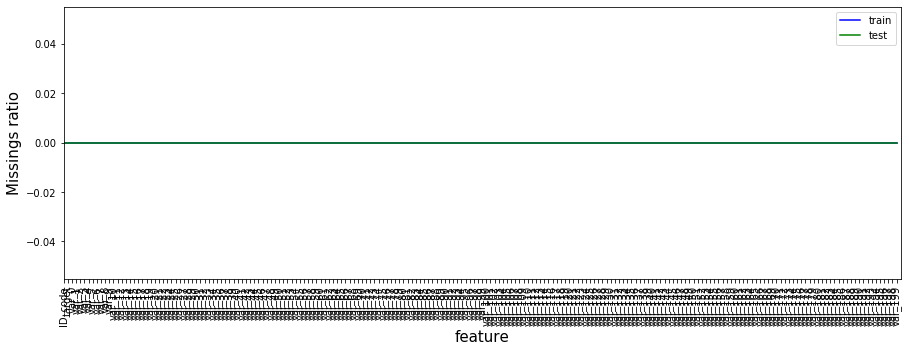

In [10]:
fig = plt.figure(figsize=(15, 5))
plt.plot(train.isnull().mean(), label="train", color="blue")
plt.plot(test.isnull().mean(), label="test", color="green")
plt.xticks(range(train.shape[1]), train.columns, rotation=90)
plt.ylabel("Missings ratio", size=15)
plt.xlabel("feature", size=15)
plt.xlim(0, train.shape[1])
plt.legend(loc="best")

In [ ]:
# sns.pairplot(train.iloc[:, 3:5])
# msno.heatmap(train)
# sns.distplot(train.iloc[:, 3:4], color="dodgerblue", label="Compact")

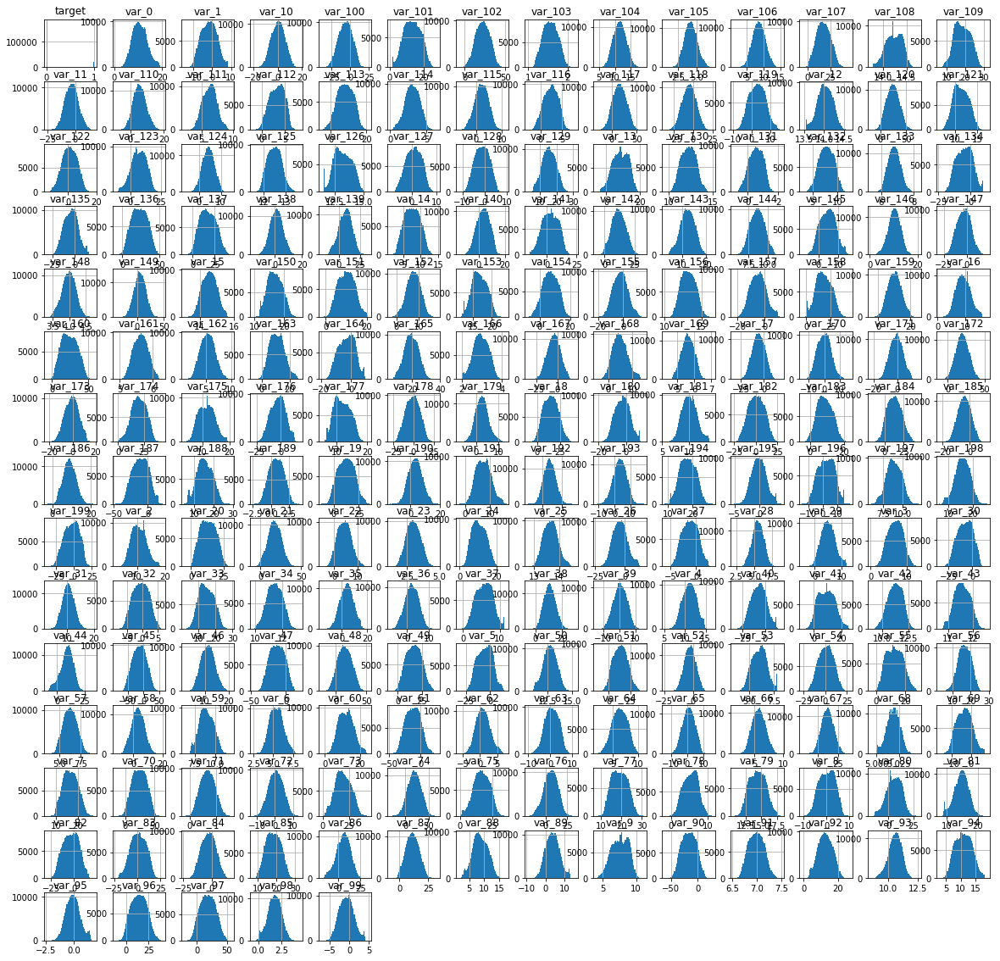

In [14]:
train.hist(figsize=(20,20), bins=50)
plt.show()

Выводы: Пропуски и выбросы в датесете отсутствуют, все дискретные признаки распределены нормально и\или с небольшим скосом.

### Задание 2: Сделать базовый анализ целевой переменной, сделать выводы.

In [15]:
train['target'].value_counts()

0    179902
1     20098
Name: target, dtype: int64

In [16]:
disbalance = train['target'].value_counts().values[0] / train['target'].value_counts().values[1]
disbalance

8.951238929246692

In [17]:
# Возьмем некоторые признаки(для примера, потому что все сразу визуализировать не позволяют мощности компьютера)
cols = [
#     'target',
        'var_0','var_1', 'var_2', 'var_5', 'var_9',
        'var_10', 'var_13','var_20', 'var_26', 'var_40',
        'var_55', 'var_80', 'var_106', 'var_109', 'var_139',
        'var_175', 'var_184', 'var_196'
       ]

In [18]:
train2 = train[:50001]
train2.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


<Figure size 1152x504 with 0 Axes>

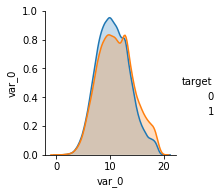

<Figure size 1152x504 with 0 Axes>

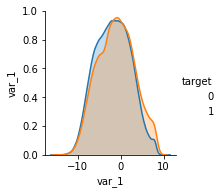

<Figure size 1152x504 with 0 Axes>

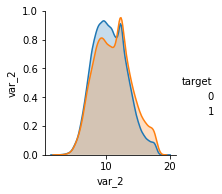

<Figure size 1152x504 with 0 Axes>

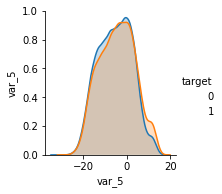

<Figure size 1152x504 with 0 Axes>

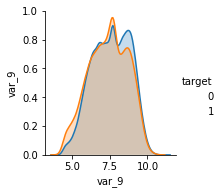

<Figure size 1152x504 with 0 Axes>

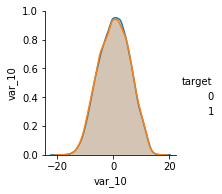

<Figure size 1152x504 with 0 Axes>

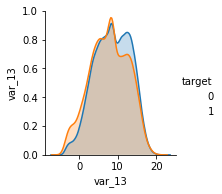

<Figure size 1152x504 with 0 Axes>

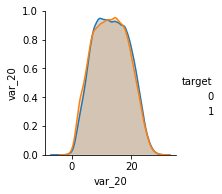

<Figure size 1152x504 with 0 Axes>

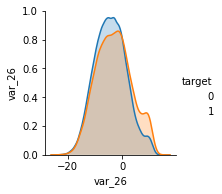

<Figure size 1152x504 with 0 Axes>

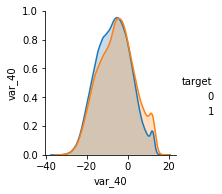

<Figure size 1152x504 with 0 Axes>

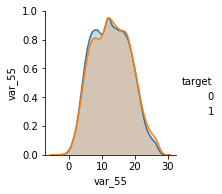

<Figure size 1152x504 with 0 Axes>

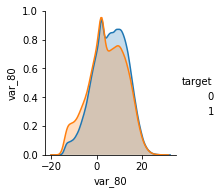

<Figure size 1152x504 with 0 Axes>

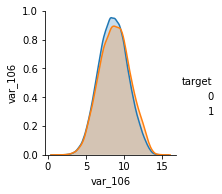

<Figure size 1152x504 with 0 Axes>

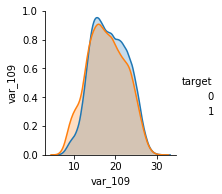

<Figure size 1152x504 with 0 Axes>

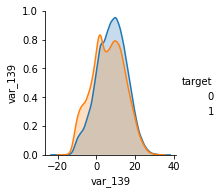

<Figure size 1152x504 with 0 Axes>

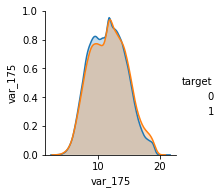

<Figure size 1152x504 with 0 Axes>

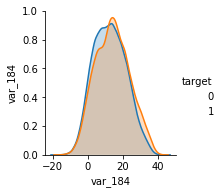

<Figure size 1152x504 with 0 Axes>

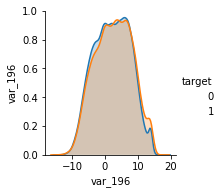

In [19]:
for feature in cols:
    plt.figure(figsize = (16, 7))
    sns.pairplot(train[[feature] + ['target']], hue='target')
    plt.show()

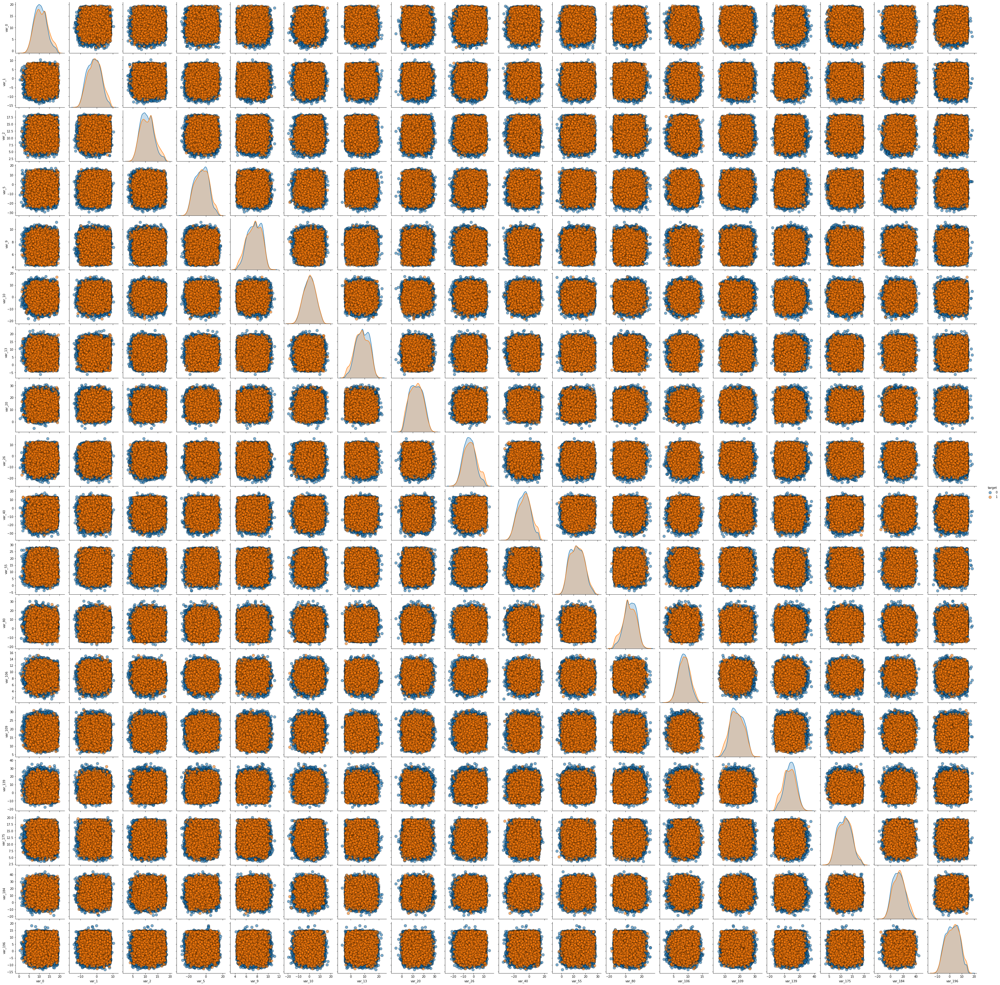

In [20]:
sns.pairplot(train2[cols + ['target']], hue = 'target', plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'})

In [21]:
train[cols + ['target']].groupby('target').count()

,var_0,var_1,var_2,var_5,var_9,var_10,var_13,var_20,var_26,var_40,var_55,var_80,var_106,var_109,var_139,var_175,var_184,var_196
target,,,,,,,,,,,,,,,,,,
0,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902,179902
1,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098,20098


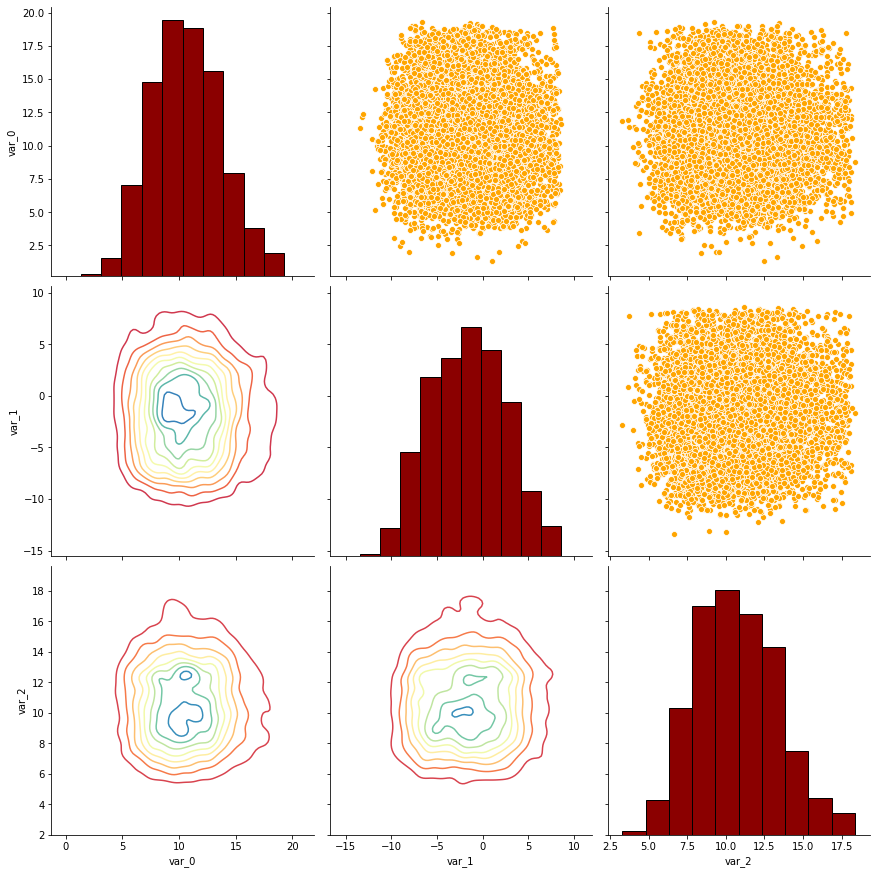

In [22]:
# Создаем PairGrid class.
grid = sns.PairGrid(data= train2.iloc[0:10001],
                    vars = ['var_0','var_1','var_2'], size = 4)

# Делаем секцию
grid = grid.map_upper(sns.scatterplot, color = 'orange')
grid = grid.map_lower(sns.kdeplot, cmap = 'Spectral')
grid = grid.map_diag(plt.hist, bins = 10, color = 'darkred', edgecolor = 'k');

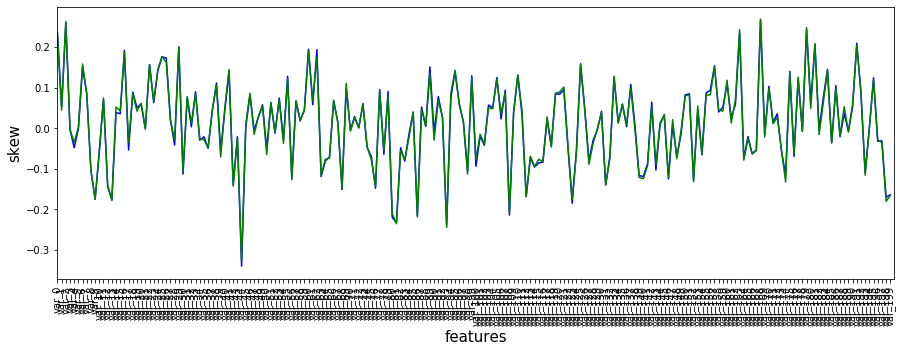

In [23]:
# Скос
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = train.drop('target', axis=1).skew(), test.skew()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.xlim(0, len(train_stats))
plt.ylabel("skew", size=15)
plt.show()

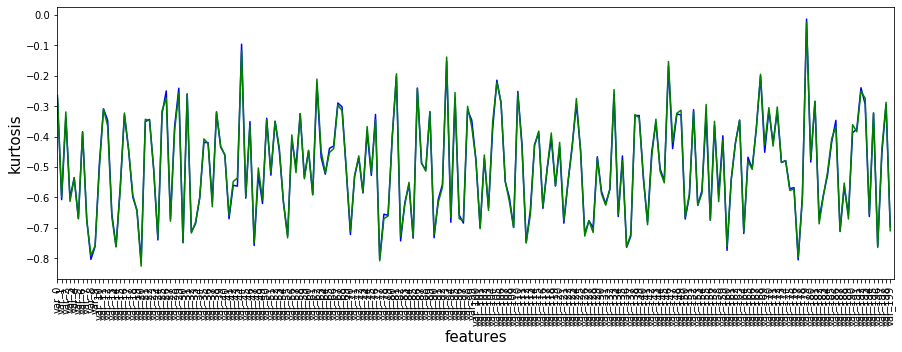

In [24]:
# Куртосис
fig = plt.figure(figsize=(15, 5))
train_stats, test_stats = train.drop('target', axis=1).kurtosis(), test.kurtosis()
plt.plot(train_stats, color="blue", label="train")
plt.plot(test_stats, color="green", label="test")
plt.xticks(range(train_stats.shape[0]), train_stats.index, rotation=90)
plt.xlabel("features", size=15)
plt.ylabel("kurtosis", size=15)
plt.xlim(0, len(train_stats))
plt.show()

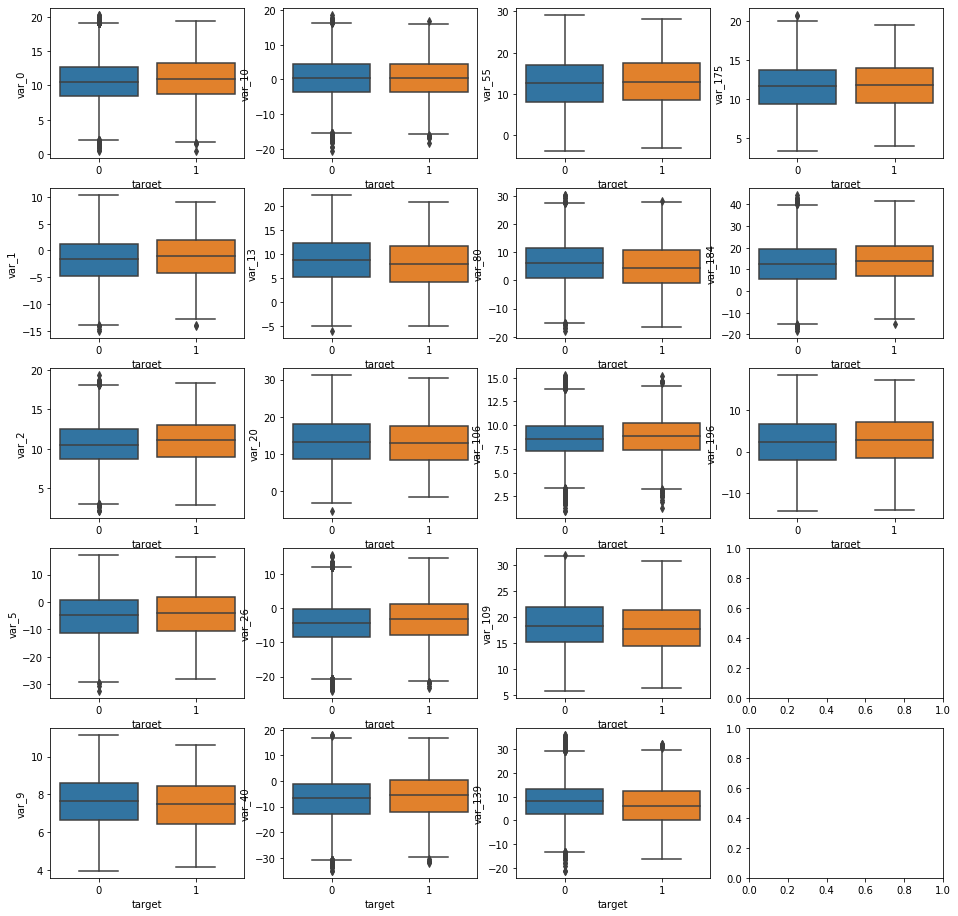

In [25]:
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(16, 16))

for num, feat in  enumerate(cols):
    sns.boxplot(x=train['target'], y=feat, data=train, ax=axes[num%5, num//5])
#     axes[num%5, num//5].legend()
    axes[num%5, num//5].set_xlabel('target')
    axes[num%5, num//5].set_ylabel(feat);

In [30]:
fram = train2[cols]
fram

,var_0,var_1,var_2,var_5,var_9,var_10,var_13,var_20,var_26,var_40,var_55,var_80,var_106,var_109,var_139,var_175,var_184,var_196
0,8.9255,-6.7863,11.9081,-9.2834,5.7470,2.9252,0.5745,10.5350,-5.1488,-5.2387,14.8322,13.6468,9.5426,24.3627,15.6599,7.7423,25.8398,7.8784
1,11.5006,-4.1473,13.8588,7.0433,8.0851,-0.4032,8.4135,3.4287,-11.7684,-11.1147,18.5995,2.5462,7.3412,13.0858,16.1622,10.4968,22.5441,8.1267
2,8.6093,-2.7457,12.0805,-9.0837,5.9525,-0.3249,7.3124,17.7559,-7.9940,-13.5174,6.2846,7.4729,5.3683,20.3882,8.6674,10.9202,23.0866,-6.5213
3,11.0604,-2.1518,8.9522,-1.8361,8.2450,2.3061,11.9704,20.3010,0.8135,-3.8294,12.3972,0.7839,10.3907,14.4135,8.9821,8.1013,-0.4639,-2.9275
4,9.8369,-1.4834,12.8746,2.4486,7.6784,-9.4458,7.8895,21.4246,3.1736,-5.5963,14.1482,2.9598,8.8230,28.2749,13.9547,16.3309,11.8503,3.9267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49996,9.4322,-1.8815,13.6529,-8.4923,9.2950,-2.6684,3.6598,14.1796,-0.3358,-2.8913,15.1011,12.9885,9.1063,16.1266,7.7212,9.0993,-7.2233,1.3548
49997,5.0599,4.0123,13.6996,-3.6238,7.5437,9.0145,1.2180,5.4361,-10.4494,-13.3669,5.6515,13.6766,7.7726,26.5308,-2.5976,9.4901,0.1764,8.5316
49998,13.9480,-2.3724,9.8394,-0.1912,6.0332,5.4977,15.8050,13.7123,0.5435,-17.8513,9.1745,2.0006,6.5474,14.0571,-1.6640,8.3858,26.4815,-1.9249
49999,14.1612,-7.5200,9.4139,3.1419,7.9303,-9.4636,10.2990,10.1247,-7.4144,-21.5808,14.5725,17.1211,8.6749,21.3165,2.3597,14.0437,18.7523,11.1404


In [31]:
# fram[[x for x in fram.columns.tolist()]]
# Медиана у векторов

fram['median'] = 0
for x in fram.index:
    fram['median'] = fram.iloc[x].median()

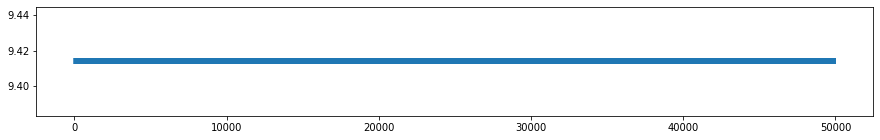

In [32]:
plt.figure(figsize=(15, 2))
plt.scatter(range(len(fram['median'])), fram['median'].values, marker='|')

Выводы: существует дисбаланс классов {'0': 1, '1': 8.951238929246692}, первого класса почти в 9 раз меньше, чем нулевого, однако дисбаланс распределен нормально. Боксплоты, описывающее статистики распределения количественных признаков в двух группах, не имеют значимых различий.

### Задание 3: Построить распределение признаков в зависимости от значения целевой переменной и распределение признаков для обучающей и тестовой выборки (если машина не позволяет построить распределение для всех признаков, то выполнить задание для признаков
 var_0, var_1, var_2, var_5, var_9, var_10, var_13, var_20, var_26, var_40, var_55, var_80, var_106, var_109, var_139, var_175, var_184, var_196), сделать выводы;


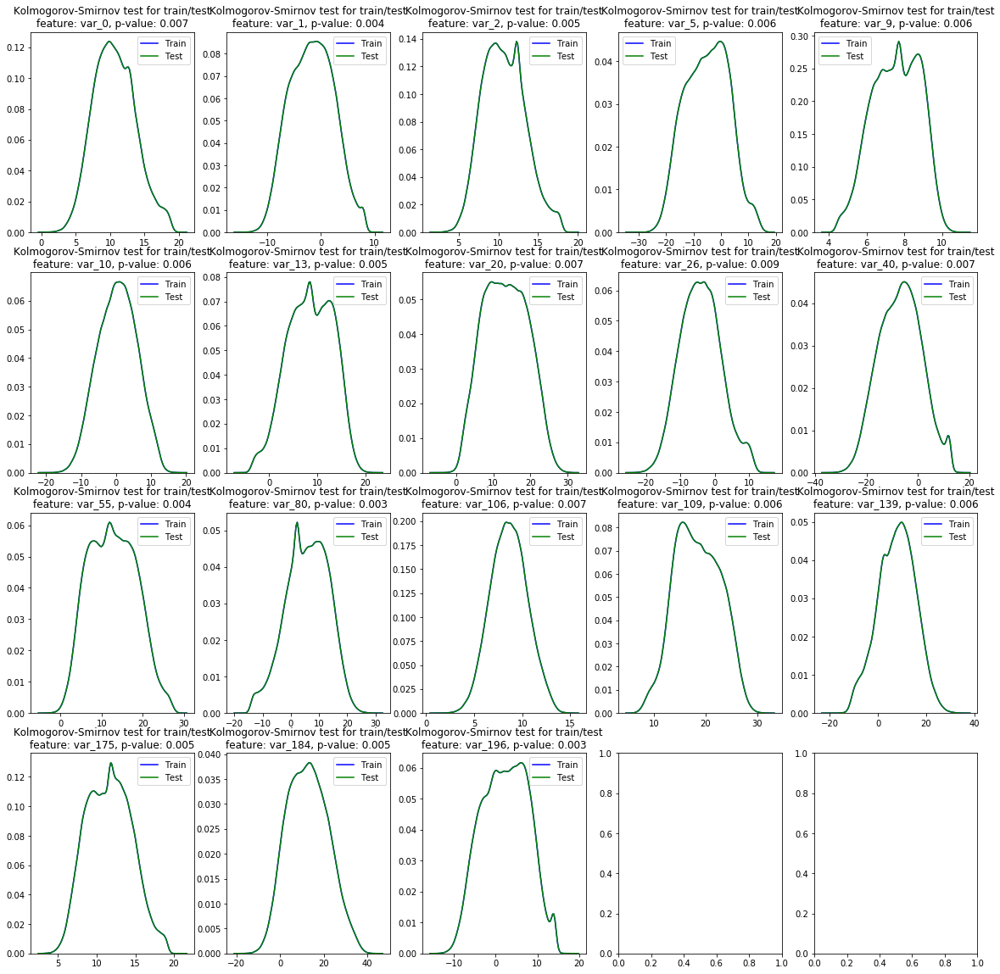

In [33]:
statistics_array = []
fig, axes = plt.subplots(4, 5, figsize=(20, 20))

for num, feature in enumerate(train[cols].columns):
    statistic, pvalue = ks_2samp(
        train[feature].sample(50000), test[feature].sample(50000)
    )
    statistics_array.append(statistic)

    sns.kdeplot(train[feature], ax=axes[num//5, num%5], color="Blue", label="Train")
    sns.kdeplot(train[feature], ax=axes[num//5, num%5], color="Green", label="Test")

    axes[num//5, num%5].set_title(
        (f"Kolmogorov-Smirnov test for train/test\n"
        f"feature: {feature}, p-value: {round(statistic, 3)}")
    )

In [34]:
# Видим, что p-value < 5 и он изменяется от объема выборки, поэтому возпользуемся следующим:

In [35]:
# Population Stability Index
class PSI(BaseEstimator, TransformerMixin):
    """
    Вычисление PSI и отбор признаков на их основе.

    Parameters
    ----------
    threshold: float
        Порог для отбора переменных по PSI.
        Если PSI для переменной выше порога - переменная макрируется
        0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

    categorical_features: List[str], optional, default = None
        Список категориальных признаков для анализа.
        Опциональный параметр, по умолчанию, не используется, т.е.
        категориальные признаки отсутствуют.

    n_bins: int, optional, default = 20
        Количество бинов, на которые разбивается выборка.

    min_value: float, optional, default = 0.005
        Значение которое используется, если рассчитанный psi = 0.

    bin_type: string, optional, default = "quanitles"
        Способ разбиения на бины: "quantiles" or "bins".
        При выборе "quantiles" - выборка будет разбита на n_bins
        квантилей, при выборке "bins" - выборка будет разбита на
        n_bins бакетов с равным шагом между бакетами.
        Иные значения приводят к возникновению ValueError.

    Attributes
    ----------
    scores_: Dict[str, float]
        Словарь со значениями PSI,
        ключ словаря - название признака, значение - PSI-score.

    """
    def __init__(self,
                 threshold: float,
                 categorical_features: Optional[List[str]] = None,
                 bin_type: str = "quantiles",
                 min_value: float = 0.005,
                 n_bins: int = 20):

        self.threshold = threshold
        self.categorical_features = categorical_features
        self.min_value = min_value
        self.n_bins = n_bins
        if bin_type in ["quantiles", "bins"]:
            self.bin_type = bin_type
        else:
            raise ValueError(
                "Incorrect bin_type value. Expected 'quantiles' or 'bins', "
                f"but {bin_type} is transferred."
            )
        self.scores = {}

    def calculate_bins(self, data: pd.Series) -> np.array:
        """
        Вычисление границ бинов для разбиения выборки.

        Parameters
        ----------
        data: pandas.Series, shape = [n_samples, ]
            наблюдения из train-выборки.

        Returns
        -------
        bins: numpy.array, shape = [self.n_bins + 1]
            Список с границами бинов.

        """
        if self.bin_type == "quantiles":
            bins = np.linspace(0, 100, self.n_bins + 1)
            bins = [np.nanpercentile(data, x) for x in bins]

        else:
            bins = np.linspace(data.min(), data.max(), self.n_bins + 1)

        return np.unique(bins)

    def calculate_psi_in_bin(self, expected_score, actual_score) -> float:
        """
        Вычисление значения psi для одного бакета.

        Осуществляется проверка на равенство нулю expected_score и
        actual_score: если один из аргументов равен нулю, то его
        значение заменяется на self.min_value.

        Parameters
        ----------
        expected_score: float
            Ожидаемое значение.

        actual_score: float
            Наблюдаемое значение.

        Returns
        -------
        value: float
            Значение psi в бине.

        """
        if expected_score == 0:
            expected_score = self.min_value
        if actual_score == 0:
            actual_score = self.min_value

        value = (expected_score - actual_score)
        value = value * np.log(expected_score / actual_score)

        return value

    def calculate_psi(self, expected: pd.Series, actual: pd.Series, bins) -> float:
        """
        Расчет PSI для одной переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        bins: pandas.Series, shape = [self.n_bins, ]
            Бины для расчета PSI.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        expected_score = np.histogram(expected.fillna(-9999), bins)[0]
        expected_score = expected_score / expected.shape[0]

        actual_score = np.histogram(actual.fillna(-9999), bins)[0]
        actual_score = actual_score / actual.shape[0]

        psi_score = np.sum(
            self.calculate_psi_in_bin(exp_score, act_score)
            for exp_score, act_score in zip(expected_score, actual_score)
        )

        return psi_score

    def calculate_numeric_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для числовой переменной.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = self.calculate_bins(expected)
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def calculate_categorical_psi(self, expected: pd.Series, actual: pd.Series) -> float:
        """
        Вычисление PSI для категориальной переменной.
        PSI рассчитывается для каждого уникального значения категории.

        Parameters
        ----------
        expected: pandas.Series, shape = [n_samples_e, ]
            Наблюдения из train-выборки.

        actual: pandas.Series, shape = [n_samples_o, ]
            Наблюдения из test-выборки.

        Returns
        -------
        psi_score: float
            PSI-значение для данной пары выборок.

        """
        bins = np.unique(expected).tolist()
        psi_score = self.calculate_psi(expected, actual, bins)
        return psi_score

    def fit(self, X, y=None):
        """
        Вычисление PSI-значения для всех признаков.

        Parameters
        ----------
        X: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        y: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        self
        """
        missed_columns = list(set(X.columns) - set(y.columns))

        if missed_columns:
            raise MissedColumnError(
                f"Missed {list(missed_columns)} columns in data.")

        if self.categorical_features:
            numeric_features = list(
                set(X.columns) - set(self.categorical_features)
            )
            for feature in self.categorical_features:
                self.scores[feature] = self.calculate_categorical_psi(
                    X[feature], y[feature]
                )
        else:
            numeric_features = X.columns

        for feature in tqdm(numeric_features):
            self.scores[feature] = self.calculate_numeric_psi(
                X[feature], y[feature]
            )
        return self

    def transform(self, X, y=None) -> pd.DataFrame:
        """
        Отбор переменных по self.threshold.
        Если PSI-score для переменной выше порога, то переменная
        помечается 0 (не использовать для дальнейшего анализа), если ниже
        порога - маркируется 1 (использовать для дальнейшего анализа).

        Parameters
        ----------
        data: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для обучения.

        target: pandas.DataFrame, shape = [n_samples, n_features]
            Матрица признаков для тестирования.

        Returns
        -------
        scores: pandas.DataFrame, shape = [n_features, 3]
            Датафрейм с PSI-анализом переменных.

        """
        check_is_fitted(self, "scores")
        scores = pd.Series(self.scores)
        scores = pd.DataFrame({"Variable": scores.index, "PSI": scores.values})
        scores["Selected"] = np.where(scores.PSI < self.threshold, 1, 0)
        scores = scores.sort_values(by="PSI")

        mask = scores["Selected"] == 1
        self.used_features = scores.loc[mask, "Variable"].tolist()

        return scores.reset_index(drop=True)


In [36]:
features_to_score = train[cols].columns.tolist()
psi = PSI(threshold=0.01)

In [37]:
psi.fit_transform(
    X=train[features_to_score],
    y=test[features_to_score]
)

100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:01<00:00, 10.92it/s]


,Variable,PSI,Selected
0,var_5,0.000138,1
1,var_196,0.000198,1
2,var_184,0.000203,1
3,var_40,0.000204,1
4,var_13,0.000207,1
5,var_109,0.000222,1
6,var_175,0.000228,1
7,var_9,0.000229,1
8,var_55,0.000235,1
9,var_1,0.000240,1


In [38]:
# Для того, чтобы учесть взаимодействие признаков и характер модели сделаем следующее:
# Adversarial Validation

In [39]:
X_adv = pd.concat([
    train[features_to_score], test[features_to_score]
])
y_adv = np.hstack(
    (np.ones(train.shape[0]), np.zeros(test.shape[0])))

X_adv = X_adv.reset_index(drop=True)

In [40]:
%%time
parameters = {"max_depth": 4, "n_estimators": 50, "random_state": 27, "n_jobs": 2}
model = xgb.XGBClassifier(**parameters)

cv = cross_val_score(
    estimator=model,
    X=X_adv, y=y_adv,
    scoring="roc_auc",
    cv=KFold(n_splits=3, shuffle=True, random_state=27)
)
print(f"CV-score: {round(np.mean(cv), 4)}")

[15:44:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:44:44] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[15:45:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
CV-score: 0.5105
Wall time: 54.1 s


[15:45:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Text(0.5, 1.0, 'Top Importance Features for Adversarial Validation (train vs test)')

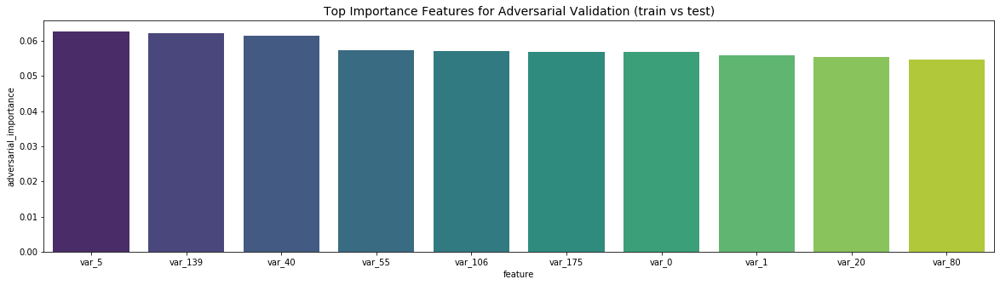

In [41]:
model.fit(X_adv, y_adv)

importance = pd.DataFrame({
    "feature": X_adv.columns,
    "adversarial_importance": model.feature_importances_
})
importance = importance.sort_values(by="adversarial_importance", ascending=False)
importance = importance.head(n=10)

plt.figure(figsize=(20, 5))
sns.barplot(x=importance["feature"], y=importance["adversarial_importance"], palette="viridis")
plt.title("Top Importance Features for Adversarial Validation (train vs test)", size=14)

Выводы: Гипотеза о том, что распределения на трейне и на тесте совпадают, справедлива(CV-score: 0.5105), (иначе CV-score должен быть ближе к единице). Индекс стабильности популяции(PSI) менее 10% и показывает отсутствие значимого изменения по признакам в текущей выборке.

In [ ]:
# Индекс стабильности популяции интерпретируется следующим образом:
# PSI менее 10% показывает отсутствие значимого изменения в текущей выборке
# PSI в диапазоне от 10 до 25% свидетельствует о незначительном изменении, которые необходимо исследовать
# PSI более 25% говорит о значительном смещении популяции и требуется перестроение модели

### Задание 4: Построить распределение основных статистик признаков (среднее, стандартное отклонение) в разрезе целевой переменной и распределение основных статистик обучающей и тестовой выборки, сделать выводы;

In [42]:
table1 = train.groupby('target').mean()
table1.reset_index(inplace=True)
table1

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,10.626681,-1.695770,10.665876,6.788979,11.072412,-5.146736,5.389620,16.549306,0.262347,...,3.149130,7.39080,1.949017,3.355403,18.017716,-0.155601,2.260297,8.919032,15.924058,-3.415273
1,1,11.156418,-1.017613,11.156633,6.864113,11.131337,-4.336522,5.581966,16.514917,0.479432,...,3.998064,7.86456,1.738266,3.120260,17.779568,-0.021130,2.688583,8.810815,15.393283,-2.532243


In [43]:
table2 = train.groupby('target').std()
table2.reset_index(inplace=True)
table2 

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,0,3.008564,4.024813,2.612961,2.040082,1.620103,7.827522,0.857983,3.417700,3.331105,...,4.522568,2.997847,1.476456,3.982819,3.127715,1.422275,5.441118,0.917467,2.978539,10.434525
1,1,3.270293,4.220638,2.841075,2.070898,1.649266,8.140281,0.922442,3.421365,3.340028,...,4.814830,3.210779,1.482537,4.067550,3.193153,1.485975,5.556892,0.952554,3.248123,10.435910


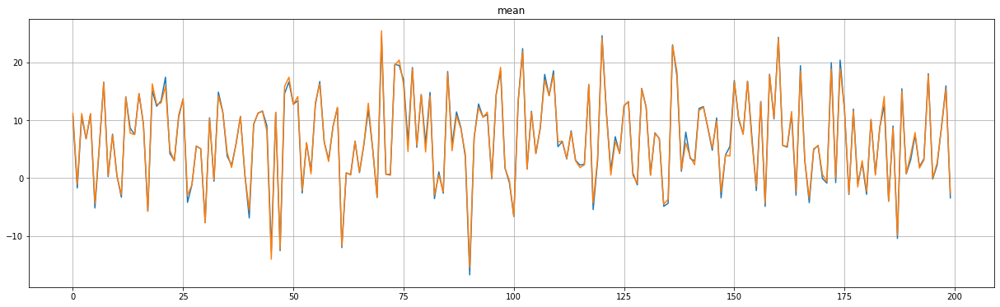

In [44]:
plt.figure(figsize=(21, 6))
plt.plot(range(len(table1.loc[table1['target'] == 0].columns.tolist()[1:])), table1.loc[table1['target'] == 0].values[0].tolist()[1:])
plt.plot(range(len(table1.loc[table1['target'] == 1].columns.tolist()[1:])), table1.loc[table1['target'] == 1].values[0].tolist()[1:])
plt.title('mean')
plt.grid()

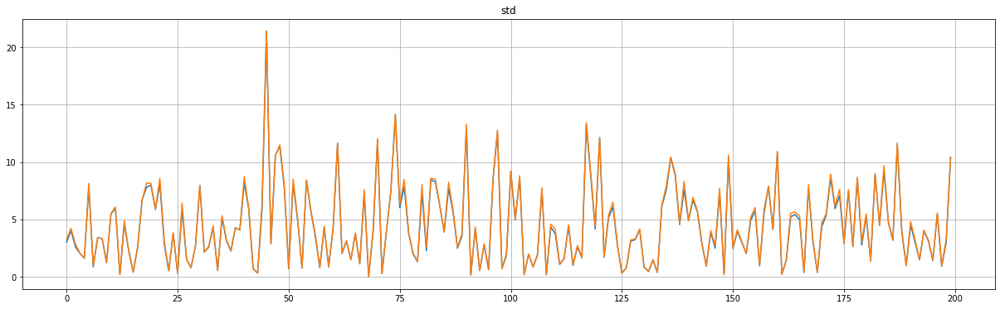

In [45]:
plt.figure(figsize=(21, 6))
plt.plot(range(len(table2.loc[table2['target'] == 0].columns.tolist()[1:])), table2.loc[table2['target'] == 0].values[0].tolist()[1:])
plt.plot(range(len(table2.loc[table2['target'] == 1].columns.tolist()[1:])), table2.loc[table2['target'] == 1].values[0].tolist()[1:])
plt.title('std')
plt.grid()

Выводы: распределения основных статистик совпадают.

### Задание 5: Построить распределение коэффициентов корреляции между признаками. 
Есть ли зависимость между признаками (будем считать, что связь между признаками отсутствует, 
если коэффициент корреляции < 0.2)?

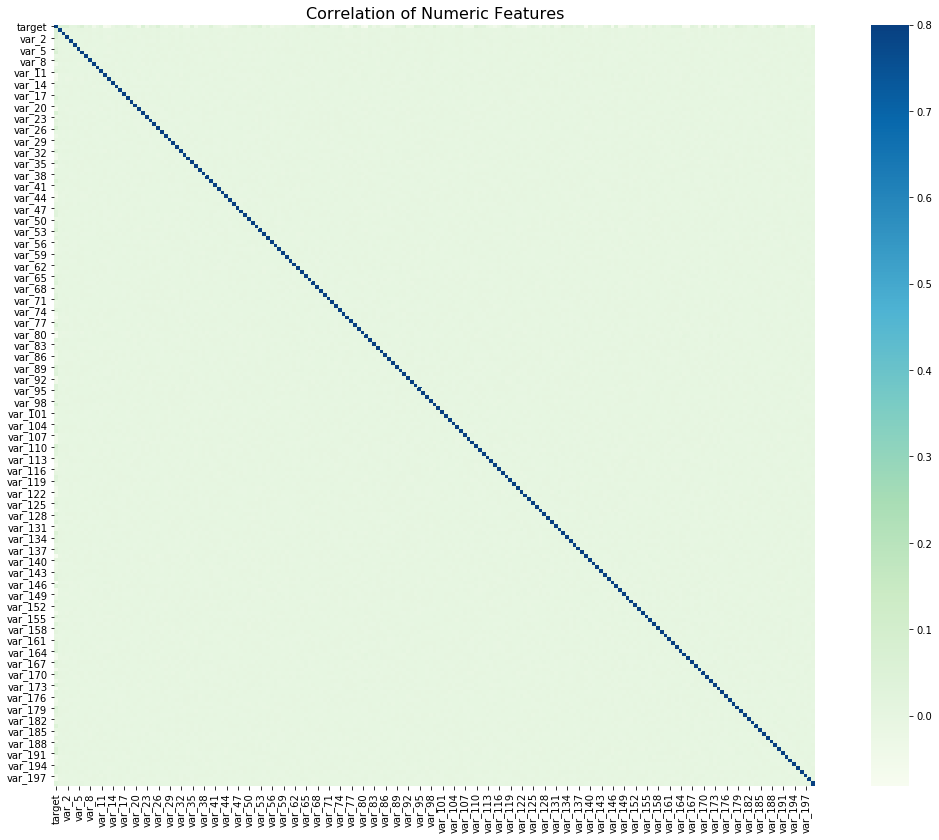

In [46]:
fig, axes = plt.subplots(figsize = (20,14))
plt.title("Correlation of Numeric Features", y=1, size=16)
sns.heatmap(train.corr(), square=True, vmax=0.8, cmap='GnBu')

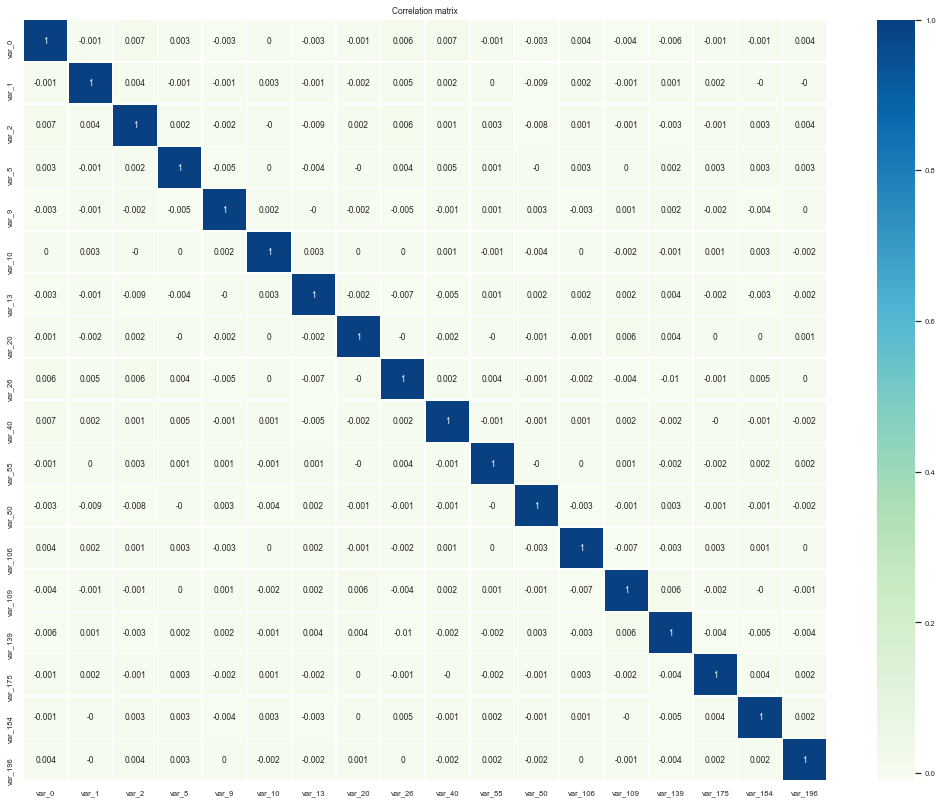

In [47]:
plt.figure(figsize = (18,14))
sns.set(font_scale=0.7)
sns.heatmap( train[cols].corr().round(3), annot=True, linewidths=.5, cmap='GnBu')
plt.title('Correlation matrix')
plt.show()

Выводы: между признаками отсутствует линейная связь((0.2 > слабая линейная связь > 0.4), (0.4 > средняя > 0.7))

### Задание 6: Выявить 10 признаков, которые обладают наибольшей нелинейной связью с целевой переменной.

In [48]:
%%time
parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99, "n_jobs": -1}

forest = RandomForestClassifier(**parameters)
forest.fit(train[cols].fillna(-9999), train['target'])

Wall time: 3.48 s


RandomForestClassifier(max_depth=6, n_estimators=25, n_jobs=-1, random_state=99)

Text(0.5, 1.0, 'What are the top important features to start with?')

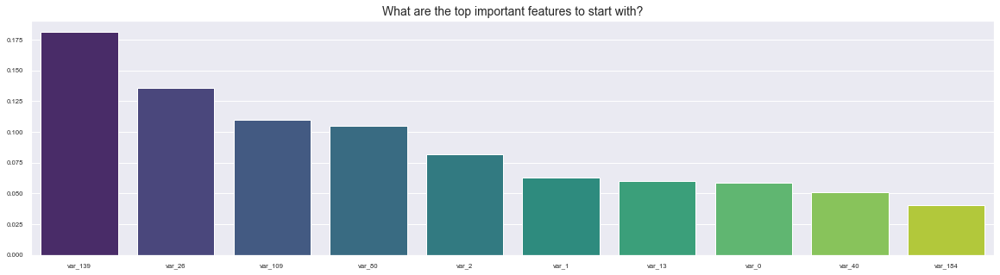

In [49]:
n_top = 10
importances = forest.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = train[cols].columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

In [50]:
from catboost import CatBoostClassifier

parameters = {"max_depth": 6, "n_estimators": 25, "random_state": 99}

ctb = CatBoostClassifier(**parameters)
ctb.fit(train[cols].fillna(-9999), train['target'])

Learning rate set to 0.5
0:	learn: 0.4512489	total: 94.5ms	remaining: 2.27s
1:	learn: 0.3709877	total: 120ms	remaining: 1.37s
2:	learn: 0.3357446	total: 141ms	remaining: 1.03s
3:	learn: 0.3203946	total: 162ms	remaining: 850ms
4:	learn: 0.3126848	total: 188ms	remaining: 752ms
5:	learn: 0.3085751	total: 211ms	remaining: 670ms
6:	learn: 0.3059372	total: 236ms	remaining: 608ms
7:	learn: 0.3045255	total: 262ms	remaining: 557ms
8:	learn: 0.3030670	total: 287ms	remaining: 510ms
9:	learn: 0.3021033	total: 311ms	remaining: 466ms
10:	learn: 0.3013538	total: 338ms	remaining: 430ms
11:	learn: 0.3007197	total: 364ms	remaining: 394ms
12:	learn: 0.3001102	total: 391ms	remaining: 361ms
13:	learn: 0.2997339	total: 416ms	remaining: 327ms
14:	learn: 0.2993971	total: 442ms	remaining: 294ms
15:	learn: 0.2990792	total: 466ms	remaining: 262ms
16:	learn: 0.2987917	total: 490ms	remaining: 231ms
17:	learn: 0.2984981	total: 515ms	remaining: 200ms
18:	learn: 0.2982963	total: 540ms	remaining: 171ms
19:	learn: 0.29

Text(0.5, 1.0, 'What are the top important features to start with?')

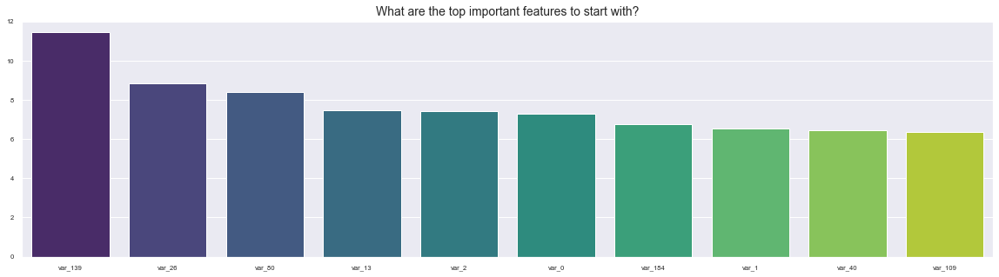

In [51]:
n_top = 10
importances = ctb.feature_importances_
idx = np.argsort(importances)[::-1][0:n_top]
feature_names = train[cols].columns

plt.figure(figsize=(20, 5))
sns.barplot(x=feature_names[idx], y=importances[idx], palette="viridis")
plt.title("What are the top important features to start with?", size=14)

Выводы: Нелинейная связь с целевой переменной существует, однако выявление 10-ти признаков, обладающих наибольшей нелинейной связью с целевой переменной, зависит от классификатора(модели). В данном случае можно сказать, что признак 'var_139' обладает наибольшей нелинейной взаимосвязью.